# HIỂN THỊ DANH SÁCH CÁC ẢNH CỦA TẬP DỮ LIỆU

1. Yêu cầu chung: Hiển thị một số ảnh trong bộ dữ liệu theo từng phân loại
  + Ví dụ minh họa:
  <IMG SRC = 'https://editor.analyticsvidhya.com/uploads/762161_OSvbuPLy0PSM2nZ62SbtlQ.png'>
2. Yêu cầu cụ thể:
  - Input: tập tin .csv, trong đó mỗi dòng tương ứng với (đường dẫn) một ảnh và categoryID. Ví dụ tập tin MotocycleDataset-Splits-1-Train.csv (xem bài https://colab.research.google.com/drive/1gf0GzvW0tHddKtuvMUNIvglUT-J6oW6S?usp=sharing)
  - Output: như hình minh họa ở trên, mỗi dòng tương ứng với một CategoryID, số lượng ảnh, kích thước ảnh là các tham số với giá trị mặc định như sau
    + NumImgsPerRow = 10
    + ImgHeight = ImgWidth = 150
  - Các ảnh mỗi dòng được chọn ngẫu nhiên ở mỗi lần chạy

3. Nộp bài: SV share notebook. Các bài nộp sớm sẽ được full điểm. Deadline: 17:00 - 10/06/2024

4. Bài làm đạt yêu cầu sẽ được paste vào notebook với ghi nhận đóng góp từ tác giả.

## Thông tin của tác giả, ngày cập nhật

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import os
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display

In [12]:
# Load the CSV file
csv_path = 'D:/CS114.O21.KHCL/Project/csv/MotocycleDataset-Splits-1-Train.csv'
data_path = 'D:/CS114.O21.KHCL/Project/Data_raw'

df = pd.read_csv(csv_path)
df.columns = ['image_dir', 'category_id']

In [3]:
# Parameters
NumImgsPerRow = 10
ImgHeight = 150
ImgWidth = 150

classes = 5
figsize_per_image = (ImgHeight/100, ImgWidth/100)
categories = {
    0: 'Others',
    1: 'Honda',
    2: 'Suzuki',
    3: 'Yamaha',
    4: 'VinFast'
}

In [4]:
df

,image_dir,category_id
0,Honda/22520968-22520996-22520999-22520929-2252...,1
1,Honda/22520968-22520996-22520999-22520929-2252...,1
2,Honda/22520968-22520996-22520999-22520929-2252...,1
3,Honda/22520968-22520996-22520999-22520929-2252...,1
4,Honda/22520968-22520996-22520999-22520929-2252...,1
...,...,...
28036,Others/22520033-22520035-22520083-22520148-225...,0
28037,Others/22520033-22520035-22520083-22520148-225...,0
28038,Others/22520033-22520035-22520083-22520148-225...,0
28039,Others/22520033-22520035-22520083-22520148-225...,0


In [5]:
# Function to create image grid for a category
def create_image_grid(category_id, df, num_imgs_per_row, img_height, img_width):
    # Filter dataframe for the given category
    category_df = df[df["category_id"] == category_id]

    # Select random images
    selected_images = category_df.sample(min(len(category_df), num_imgs_per_row)).reset_index(drop=True)

    # Calculate grid size
    num_images = len(selected_images)
    num_rows = (num_images // num_imgs_per_row) + (num_images % num_imgs_per_row > 0)

    # Create a new blank image with extra space for category label
    grid_img = Image.new("RGB", (img_width * (num_imgs_per_row + 1), img_height * num_rows), "white")
    draw = ImageDraw.Draw(grid_img)

    # Define font (ensure the font path is correct or choose a default font)
    try:
        font = ImageFont.truetype("arial.ttf", 20)
    except IOError:
        font = ImageFont.load_default()

    # Write the category label next to each row
    category_name = categories[category_id]

    # Paste images into the grid and add category label
    for row in range(num_rows):
        y = row * img_height
        # Draw the category label
        draw.text((10, y + img_height // 2 - 12), category_name, fill="black", font=font)
        for col in range(num_imgs_per_row):
            idx = row * num_imgs_per_row + col
            if idx >= num_images:
                break
            img_path = os.path.join(data_path, selected_images.loc[idx, "image_dir"])
            try:
                img = Image.open(img_path).resize((img_width, img_height))
                x = (col + 1) * img_width  # Shift right by one image width to make space for label
                grid_img.paste(img, (x, y))
            except Exception as e:
                print(f"Error loading image {img_path}: {e}")
                continue

    return grid_img


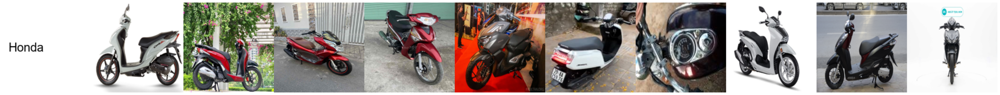

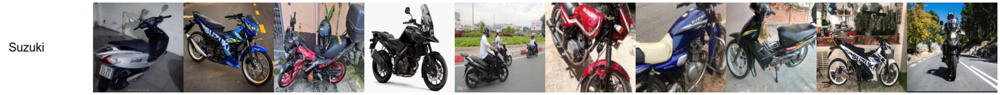

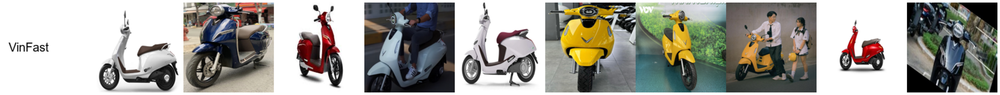

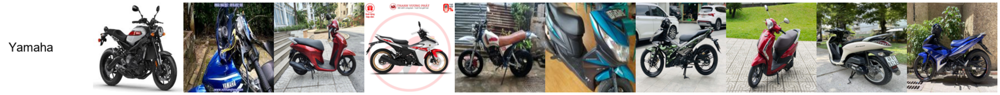

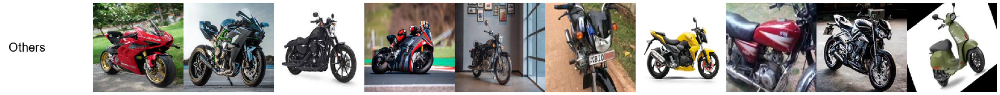

In [13]:
# Iterate through each category and create image grids
for category_id in df["category_id"].unique():
    grid_img = create_image_grid(category_id, df, NumImgsPerRow, ImgHeight, ImgWidth)
    # Display the image grid
    plt.figure(figsize=(50, 10))
    plt.imshow(grid_img)
    plt.axis('off')
    plt.show()